# PCA with AUSTEN

DS 5001 Text as Data

**Purpose:**  Implement PCA with the works of Austen.

# Set Up

## Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [2]:
import plotly_express as px
import seaborn as sns

In [3]:
sns.set(style='ticks')

## Config

In [4]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
output_dir = config['DEFAULT']['output_dir']

In [5]:
data_prefix = 'austen-melville'
OHCO = ['book_id', 'chap_id']
colors = "YlGnBu" 

# Prepare the Data

## Import tables

**Downloads**

- [austen-melville-VOCAB2.csv](https://www.dropbox.com/scl/fi/u4t0o5zpoaunyi4l5dklr/austen-melville-VOCAB2.csv?rlkey=5m3fiuucraflg4ntoxqc0t3hv&dl=0)
- [austen-melville-LIB_LABELS.csv](https://www.dropbox.com/scl/fi/f63v0pjqemsody71c9sun/austen-melville-LIB_LABELS.csv?rlkey=0ue1mz9x2ycqybcwti0vsnm9y&dl=0)
- [austen-melville-TFIDF_chap_L2.csv](https://www.dropbox.com/scl/fi/25vtge2qf1b5fed9or1y6/austen-melville-TFIDF_chap_L2.csv?rlkey=fkz9yk0enmlzt3z85ouusgcy2&dl=0)

In [6]:
VOCAB = pd.read_csv(f'{output_dir}/{data_prefix}-VOCAB2.csv').set_index('term_str')
LIB = pd.read_csv(f'{output_dir}/{data_prefix}-LIB_LABELS.csv').set_index('book_id')
TFIDF = pd.read_csv(f'{output_dir}/{data_prefix}-TFIDF_chap_L2.csv').set_index(['book_id', 'chap_id'])

## Generate analytical tables

In [7]:
class AUSTEN: pass

In [8]:
AUSTEN.LIB = LIB[LIB.author.str.match('AUSTEN')]
AUSTEN.TFIDF = TFIDF.loc[AUSTEN.LIB.index]

# PCA

In [9]:
n_comps = 5
pc_cols = [f"PC{i}" for i in range(n_comps)]
pca_engine = PCA(n_components=n_comps)

In [10]:
DCM = pd.DataFrame(pca_engine.fit_transform(AUSTEN.TFIDF.fillna(0)), index=AUSTEN.TFIDF.index)
DCM.columns = pc_cols # ['PC{}'.format(i) for i in DCM.columns]
DCM = DCM.join(AUSTEN.LIB, on='book_id')
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [11]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS.index = AUSTEN.TFIDF.columns
LOADINGS.index.name = 'term_str'
LOADINGS = LOADINGS.join(VOCAB)

# Visualize

In [12]:
def vis_pcs(a=0, b=1, label='title', hover_name='doc', symbol=None, size=None):
    return px.scatter(DCM, f"PC{a}", f"PC{b}", 
                    color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

In [13]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    return px.scatter(LOADINGS.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', hover_name='term_str',
                      size='dfidf', color='max_pos_group', 
                      marginal_x='box', height=800)

## PC 0 and 1

In [14]:
vis_pcs(0, 1)

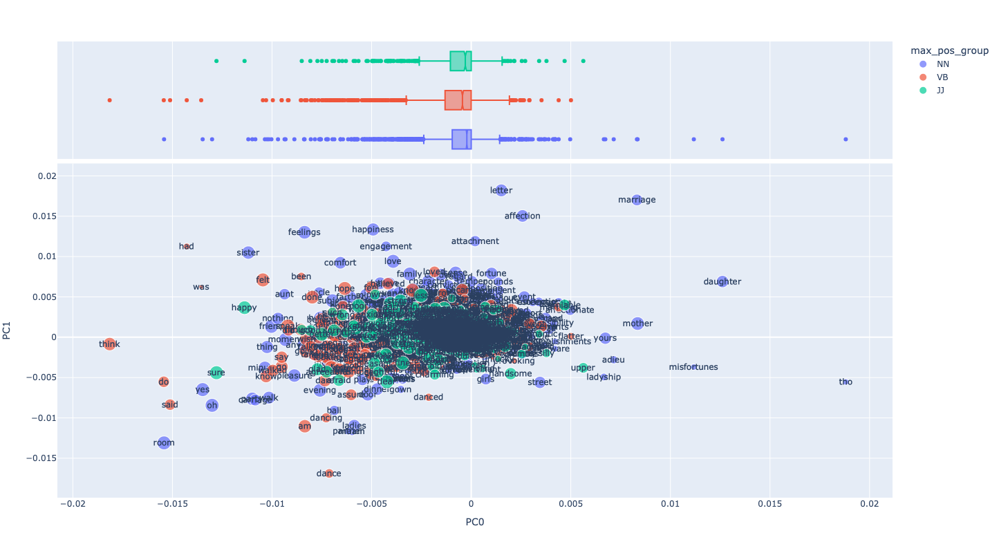

In [42]:
vis_loadings(0, 1)

## PC 1 and 2

In [16]:
vis_pcs(1, 2)

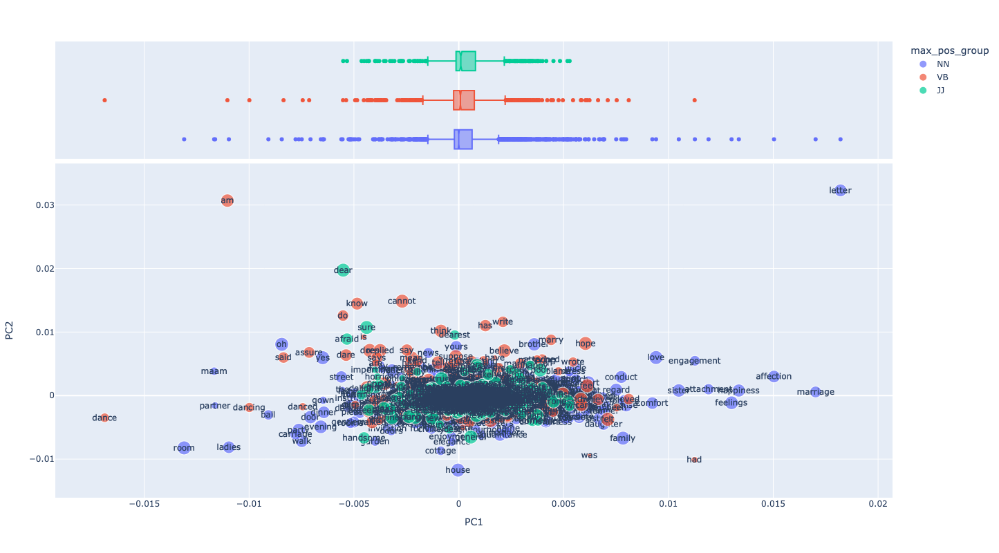

In [43]:
vis_loadings(1, 2)

##  PC 2 and 3

In [18]:
vis_pcs(2, 3)

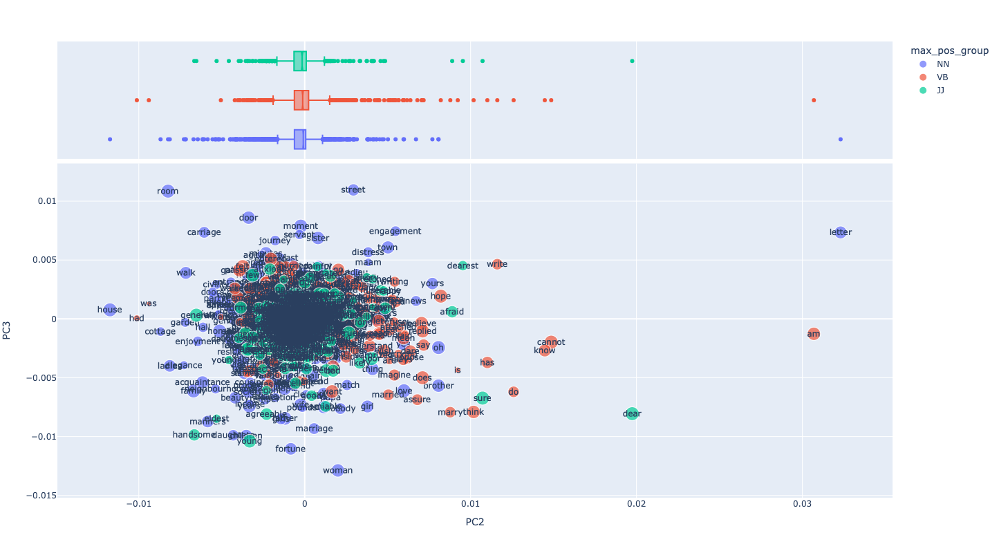

In [44]:
vis_loadings(2, 3)

## Interpet Loadings

In [20]:
top_terms_sk= {}

data = []
for i in range(n_comps):
    for j in [0, 1]:
        data.append((f"PC{i}", j, ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())))

comp_strs = pd.DataFrame(data)
comp_strs.columns =  ['pc', 'pole', 'top_terms']
comp_strs = comp_strs.set_index(['pc', 'pole'])

In [21]:
COMPS = comp_strs

In [22]:
COMPS

top_terms
pc  pole                                                   
PC0 0     tho daughter misfortunes mother marriage adieu...
    1          think do room said had was yes oh sure happy
PC1 0     letter marriage affection happiness feelings a...
    1     dance room maam partner am ladies dancing ball...
PC2 0     letter am dear cannot know do write has sure t...
    1     house had was cottage room ladies elegance gar...
PC3 0     street room door moment engagement carriage le...
    1     woman fortune young children daughters handsom...
PC4 0     mother sister sisters married dear daughters p...
    1     feelings ball upper dearest friendship friend ...

In [23]:
COMPS['top_doc'] = pd.concat([DCM[pc_cols].idxmax(), DCM[pc_cols].idxmin()], axis=0, keys=[0,1])\
    .to_frame('top_doc')\
    .reset_index()\
    .rename(columns={'level_0':'pole', 'level_1':'pc'})\
    .set_index(['pc','pole'])\
    .sort_index()

In [24]:
COMPS

top_terms     top_doc
pc  pole                                                               
PC0 0     tho daughter misfortunes mother marriage adieu...   (1212, 3)
    1          think do room said had was yes oh sure happy   (158, 26)
PC1 0     letter marriage affection happiness feelings a...   (141, 48)
    1     dance room maam partner am ladies dancing ball...  (1212, 22)
PC2 0     letter am dear cannot know do write has sure t...    (158, 7)
    1     house had was cottage room ladies elegance gar...    (161, 6)
PC3 0     street room door moment engagement carriage le...   (161, 28)
    1     woman fortune young children daughters handsom...    (158, 4)
PC4 0     mother sister sisters married dear daughters p...  (1342, 49)
    1     feelings ball upper dearest friendship friend ...   (946, 39)

In [25]:
TFIDF.loc[(141, 48)].sort_values(ascending=False).head(20)

term_str
comfort           0.204021
temper            0.160941
happiness         0.160926
punishment        0.156084
had               0.127712
became            0.127529
disappointment    0.119748
disposition       0.106543
domestic          0.098981
regretting        0.095760
been              0.094109
feelings          0.089508
education         0.088399
parent            0.088310
loved             0.087564
guilt             0.087522
sense             0.086547
useful            0.086332
anger             0.079110
vanity            0.078866
Name: (141, 48), dtype: float64

# Cluster Loadings

In [26]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from string import ascii_uppercase as ltrs

In [27]:
k = n_comps * 2
# LOADINGS['cat'] = [ltrs[i] for i in KMeans(k, n_init=10).fit_predict(LOADINGS[pc_cols])]
LOADINGS['cat'] = [ltrs[i] for i in AgglomerativeClustering(k).fit_predict(LOADINGS[pc_cols])]

In [28]:
# LOADINGS['cat'].value_counts()

In [29]:
LOADINGS['maxpc'] = LOADINGS[pc_cols].idxmax(1)
LOADINGS['minpc'] = LOADINGS[pc_cols].idxmin(1)

In [30]:
LOADINGS

,PC0,PC1,PC2,PC3,PC4,term_rank,n,n_chars,p,i,...,idf,tfidf_mean,tfidf_sum,dfidf,dp,di,dh,cat,maxpc,minpc
term_str,,,,,,,,,,,,,,,,,,,,,
home,-0.007568,0.002366,-0.005130,-0.001037,0.000200,227,954,4,0.000463,11.075638,...,1.353780,0.000570,0.639132,594.309346,0.391266,1.353780,0.529687,D,PC1,PC0
cried,-0.007280,-0.002289,0.004219,0.001041,0.003668,179,1232,5,0.000598,10.706696,...,1.337441,0.000896,1.005845,593.823846,0.395722,1.337441,0.529255,G,PC2,PC0
certain,-0.001391,0.001109,0.000968,0.000368,0.002234,291,707,7,0.000343,11.507917,...,1.366985,0.000498,0.558589,594.638636,0.387701,1.366985,0.529981,H,PC4,PC0
looking,-0.006900,-0.003819,-0.001515,-0.000397,-0.000326,242,880,7,0.000427,11.192123,...,1.390390,0.000530,0.594542,595.086909,0.381462,1.390390,0.530380,F,PC4,PC0
manner,-0.003608,0.001290,0.000068,0.000083,-0.000894,272,748,6,0.000363,11.426589,...,1.410758,0.000454,0.509838,595.339780,0.376114,1.410758,0.530606,D,PC1,PC0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
syllables,-0.000215,0.000133,0.000208,0.000104,0.000268,6513,22,9,0.000011,16.514051,...,5.672425,0.000057,0.063680,124.793358,0.019608,5.672425,0.111224,C,PC4,PC0
consumed,-0.000460,0.000050,-0.000051,-0.000152,0.000157,6237,24,8,0.000012,16.388520,...,5.739540,0.000059,0.066044,120.530330,0.018717,5.739540,0.107425,C,PC4,PC0
kindest,-0.000988,-0.000190,0.000448,-0.000020,-0.000556,6372,23,7,0.000011,16.449921,...,5.739540,0.000044,0.049807,120.530330,0.018717,5.739540,0.107425,C,PC2,PC0


In [31]:
LOADINGS.groupby('maxpc').apply(lambda x: ' '.join(x.index), include_groups=False)

maxpc
PC0    deck dark form story age beauty crew heads var...
PC1    home manner general felt known best short name...
PC2    cried set oh times find true put sure word poo...
PC3    rest passed others high moment sight looked tu...
PC4    certain looking people hands fine new next sma...
dtype: object

In [32]:
LOADINGS.groupby('minpc').apply(lambda x: ' '.join(x.index), include_groups=False)

minpc
PC0    home cried certain looking manner felt set oh ...
PC1    keep am stand door order black cold ye town to...
PC2    general fine new small house water large famil...
PC3    people therefore love years dear person young ...
PC4    given doubt feelings common dark degree mine v...
dtype: object

In [33]:
# LOADINGS

In [34]:
def vizpc(a, b):
    return px.scatter(LOADINGS.reset_index(), f'PC{a}', f'PC{b}', 
                      color='cat', 
                      # size='dh',
                      hover_name='term_str', 
                      marginal_x='box', height=800, width=900)

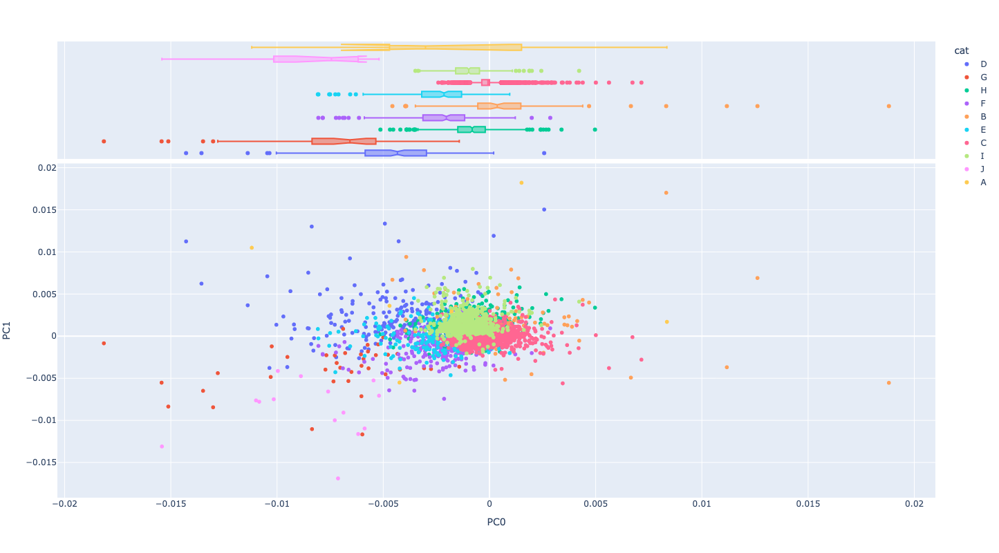

In [45]:
vizpc(0, 1)

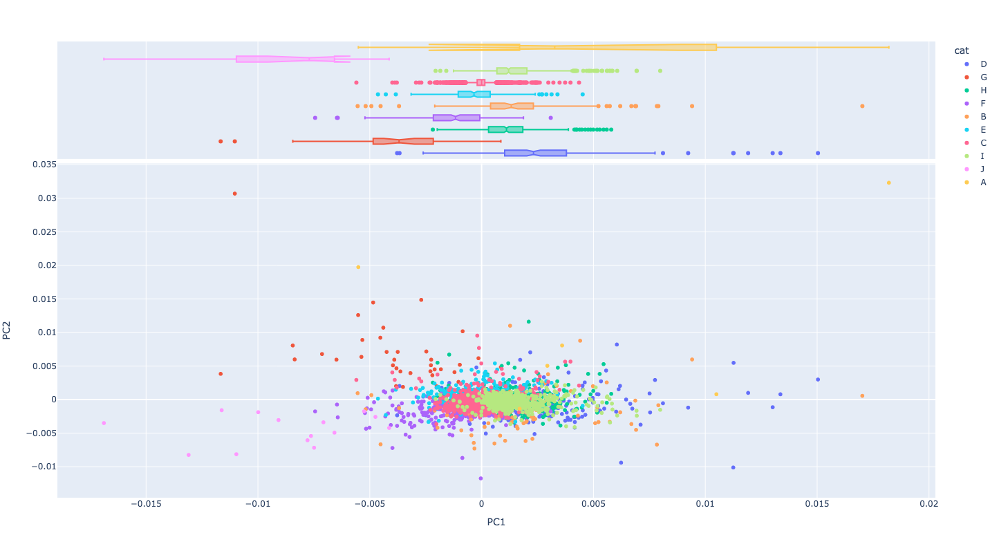

In [46]:
vizpc(1, 2)

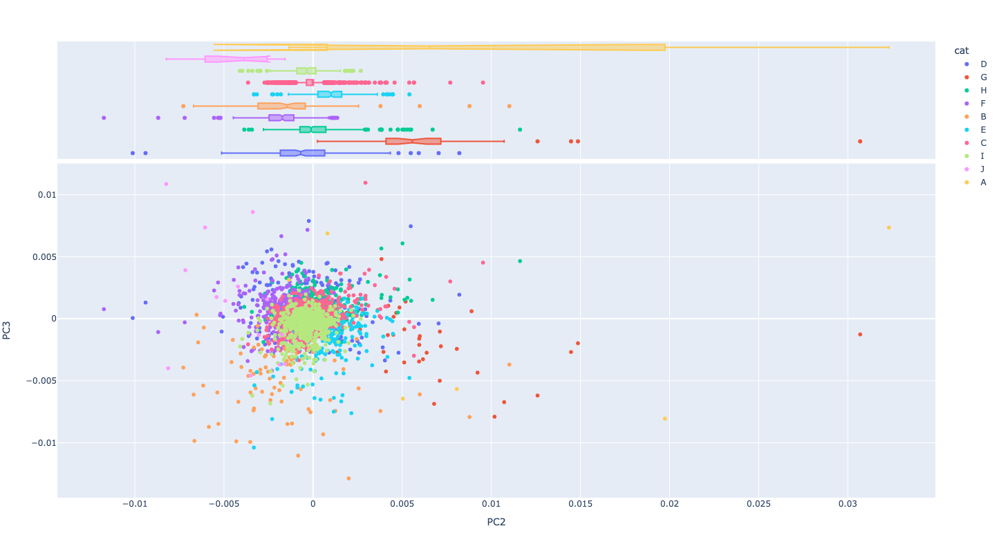

In [47]:
vizpc(2, 3)

In [38]:
vizpc(3, 4)

# Categories

In [39]:
CATS = LOADINGS.groupby('cat').n.sum().to_frame('n')
CATS['p'] = CATS.n / CATS.n.sum()
CATS['i'] = np.log2(1/CATS.p)
CATS['h'] = CATS.p * CATS.i
CATS['dfidf_mean'] = LOADINGS.groupby('cat').dfidf.mean()
CATS['top_terms'] = LOADINGS.groupby('cat').apply(lambda x: ' '.join(x.sort_values('dfidf', ascending=False).head(10).index), include_groups=False)
CATS['maxpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmax(1)
CATS['minpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmin(1)

In [40]:
CATS.sort_values('dfidf_mean', ascending=False).style.background_gradient()

,n,p,i,h,dfidf_mean,top_terms,maxpc,minpc
cat,,,,,,,,
A,4708,0.006083,7.361062,0.044775,536.801796,dear mother brother sister letter married,PC4,PC0
G,58968,0.076187,3.714316,0.282982,487.033437,sure does hear cried yes oh cannot tell suppose heard,PC2,PC0
J,5745,0.007423,7.073870,0.052506,449.018226,room evening pleasure party door walk ladies walked play carriage,PC3,PC1
D,188672,0.243764,2.036440,0.496412,443.938735,short word passed friend knew manner felt gone hope speak,PC1,PC0
E,67924,0.087758,3.510327,0.308059,361.821184,people true ill find coming told set best put keep,PC2,PC0
F,63473,0.082007,3.608106,0.295891,357.036702,new fine sight rest face open turned looking get brought,PC3,PC0
B,24587,0.031766,4.976353,0.158081,351.104539,general therefore love years family father death live woman visit,PC4,PC3
H,66752,0.086244,3.535438,0.304909,293.601962,kind certain took gave strange reason matter days soul received,PC1,PC0
I,69616,0.089944,3.474830,0.312540,281.029785,name given known making point course taken light end person,PC1,PC0


In [41]:
px.scatter(CATS.reset_index(), 'i', 'dfidf_mean', 
           hover_name='top_terms',
           text='cat', size='n', 
           height=500, width=600)